# Investigate excess DIASource detections due to diffim background modeling

Viewing smoothed diffims from https://jira.lsstcorp.org/browse/DM-17281 reveals background gradients near the corners of some chips which are not present in the calexps or the templates.  These areas show an excess of DIASource detections.
This ticket is to investigate this failure and potentially identify changes in configurations that provide better performance.

In [1]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
#import matplotlib.ticker as plticker
import pandas as pd
import sqlite3

from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize
import astropy.units as u
import astropy.coordinates as coord
from scipy.ndimage import gaussian_filter
import itertools

import lsst.geom
#from lsst.daf.base import DateTime
#from lsst.pipe.base import Struct
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

### Importing some custom functions from the `ap_pipe-notebooks` repo

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')

In [3]:
import importlib
from diaObjectAnalysis import loadAllPpdbObjects, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve

### Execute this cell if you change anything in the functions you're importing above

In [ ]:
importlib.reload(plc)

### Load the repo and DIAObject table

In [4]:
repo = '/project/mrawls/hits2015/rerun/cw_processed5'
butler = dafPersist.Butler(repo)
dbPath = os.path.join(repo, 'association.db')

In [5]:
templateRepo = '/project/mrawls/hits2014/coadds_processed2'
templateButler = dafPersist.Butler(templateRepo)

In [6]:
objTable = loadAllPpdbObjects(repo)

### Plot sources without much filtering to find problem ccds

In [22]:
miniFilter = (objTable['nDiaSources'] < 3)
oneField = (objTable['ra'] < 153) & (objTable['nDiaSources'] < 10)
otherFields = (objTable['ra'] > 153) & (objTable['nDiaSources'] < 10)

<IPython.core.display.Javascript object>


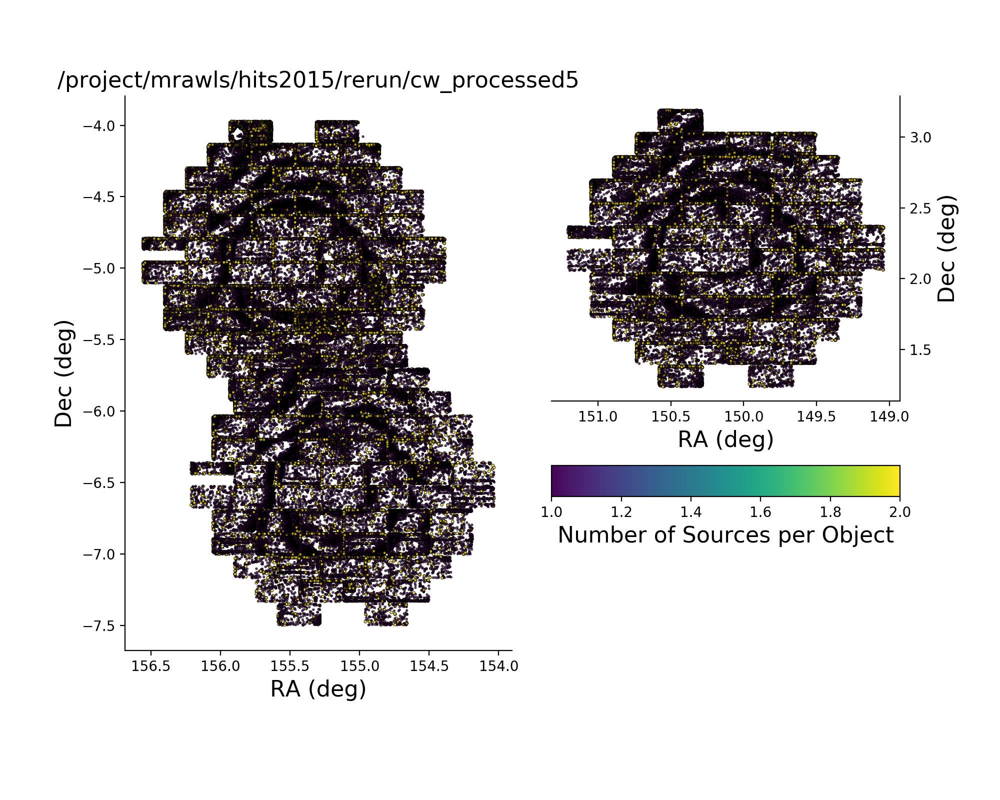

In [23]:
fig = plotDiaObjectsOnSky(repo, objTable, miniFilter, hits=True)

Zooming in on these figures, which center on 2 of the 3 HiTS2015 fields, we see large scale structure problem areas (black) composed of DIAObjects with just 1-2 sources. The problem areas are consistent as a function of CCD. Let's confirm these regions are the same ones that appear funky in the smoothed diffims but not in the smoothed calexps.

### Try plotting Gaussian-smoothed diffims to reproduce the issue we saw with ds9

In [9]:
ccdList = [1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
           21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
           41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62]

In [10]:
visitList26 = [410915, 410971, 411021, 411055, 411255, 411305, 411355, 411406, 
               411456, 411657, 411707, 411758, 411808, 411858, 412060, 412250, 
               412307, 412504, 412554, 412604, 412654, 412704, 413635, 413680, 
               415314, 415364, 419791, 421590]

visitList40 = [410929, 410985, 411035, 411069, 411269, 411319, 411369, 411420, 
               411470, 411671, 411721, 411772, 411822, 411872, 412074, 412264, 
               412321, 412518, 412568, 412618, 412668, 412718, 413649, 413694, 
               415328, 415378, 419802, 421604]

visitList42 = [410931, 410987, 411037, 411071, 411271, 411321, 411371, 411422, 
               411472, 411673, 411724, 411774, 411824, 411874, 412076, 412266, 
               412324, 412520, 412570, 412620, 412670, 412720, 413651, 413696, 
               415330, 415380, 419804, 421606]

<IPython.core.display.Javascript object>


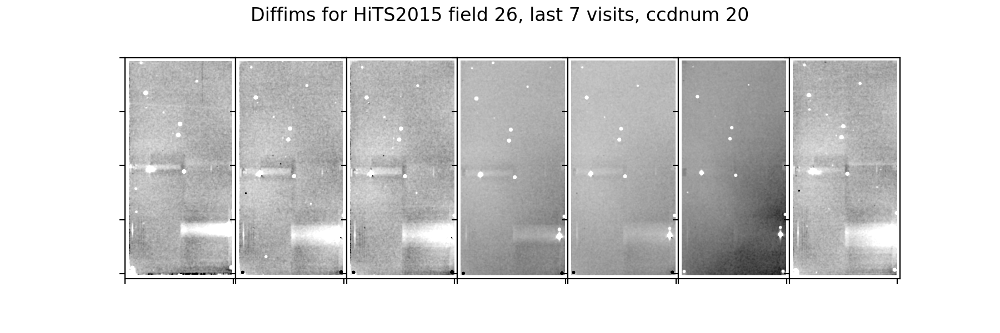

In [30]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Diffims for HiTS2015 field 26, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList26[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        diffim = butler.get('deepDiff_differenceExp', dataId=dataId)
    except:
        continue
    else:
        diffimArray = diffim.maskedImage.image.getArray()
        filtered = gaussian_filter(diffimArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


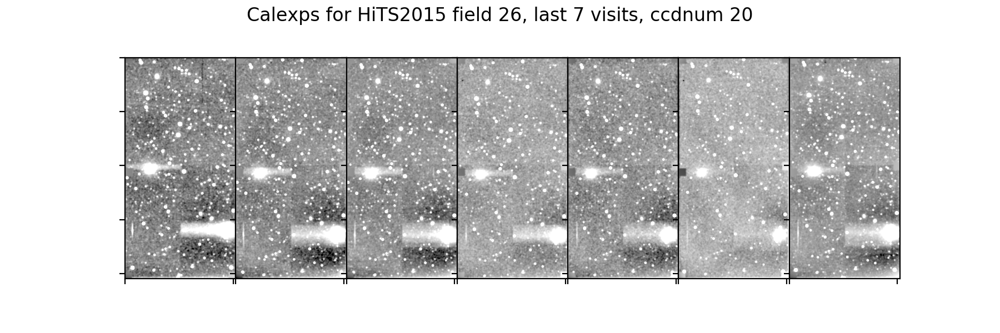

In [25]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Calexps for HiTS2015 field 26, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList26[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        calexp = butler.get('calexp', dataId=dataId)
    except:
        continue
    else:
        calexpArray = calexp.maskedImage.image.getArray()
        filtered = gaussian_filter(calexpArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

### It is tempting to think the bright source in the lower right of the ccd as plotted above may be responsible for the wonkiness, but if that were the case, the other two fields wouldn't have the exact same problem

<IPython.core.display.Javascript object>


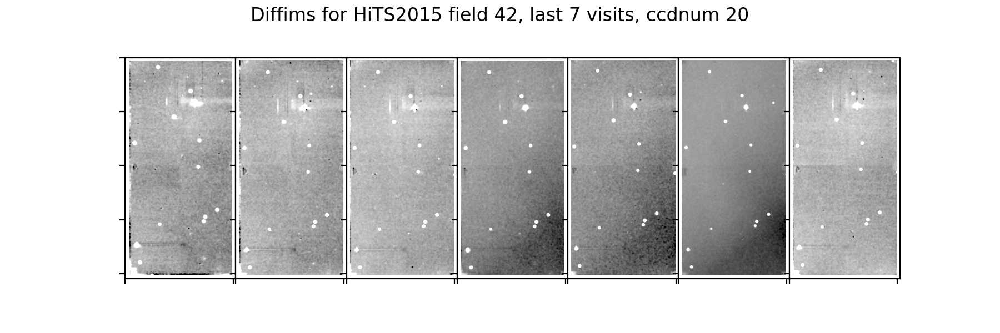

In [26]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Diffims for HiTS2015 field 42, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList42[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        diffim = butler.get('deepDiff_differenceExp', dataId=dataId)
    except:
        continue
    else:
        diffimArray = diffim.maskedImage.image.getArray()
        filtered = gaussian_filter(diffimArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


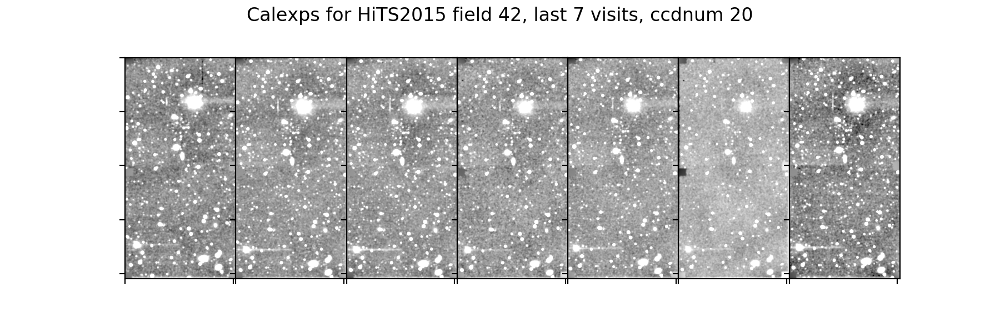

In [27]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Calexps for HiTS2015 field 42, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList42[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        calexp = butler.get('calexp', dataId=dataId)
    except:
        continue
    else:
        calexpArray = calexp.maskedImage.image.getArray()
        filtered = gaussian_filter(calexpArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


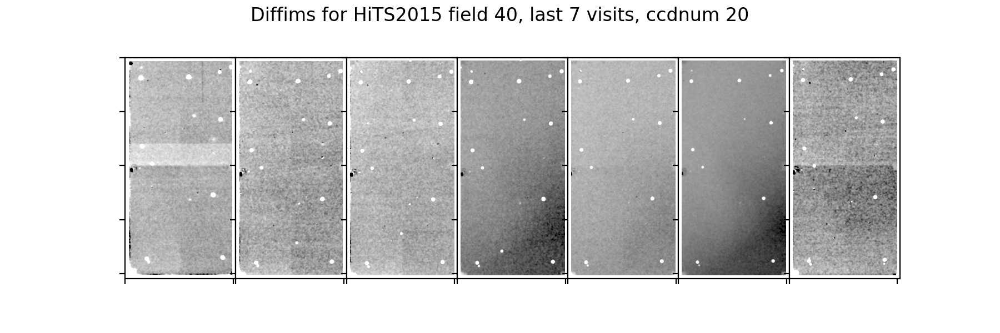

In [28]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Diffims for HiTS2015 field 40, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList40[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        diffim = butler.get('deepDiff_differenceExp', dataId=dataId)
    except:
        continue
    else:
        diffimArray = diffim.maskedImage.image.getArray()
        filtered = gaussian_filter(diffimArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


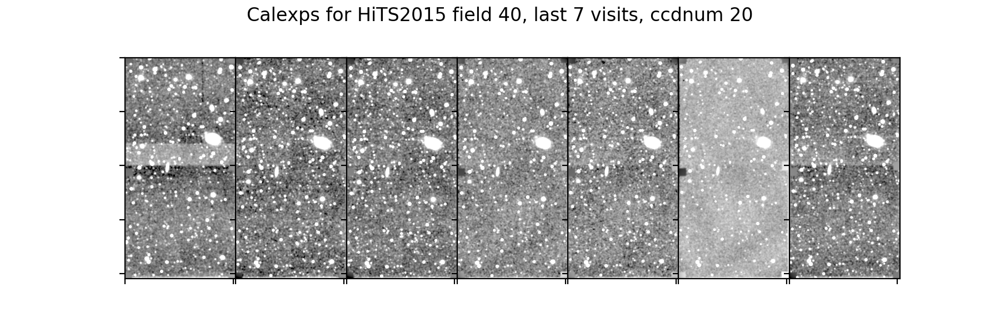

In [29]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Calexps for HiTS2015 field 40, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList40[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        calexp = butler.get('calexp', dataId=dataId)
    except:
        continue
    else:
        calexpArray = calexp.maskedImage.image.getArray()
        filtered = gaussian_filter(calexpArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

### Plotting DIASources for field 26, ccd 20

In [31]:
oneCcd = ((objTable['ra'] > 149.5) & (objTable['ra'] < 149.8) &
         (objTable['decl'] > 2.38) & (objTable['decl'] < 2.54)) # ccdnum 20

<IPython.core.display.Javascript object>


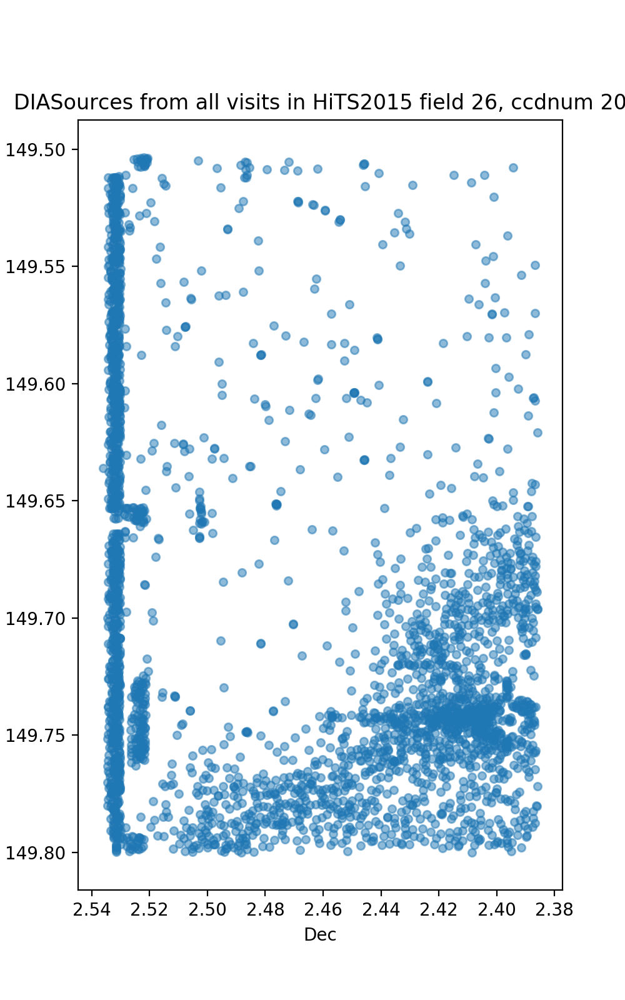

In [32]:
plt.figure(figsize=(5,8))
plt.title('DIASources from all visits in HiTS2015 field 26, ccdnum 20')
plt.xlabel('Dec')
plt.ylabel('RA')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
for obj in objTable.loc[oneCcd, 'diaObjectId']:
    sources = plc.loadPpdbSources(dbPath, obj)
    ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
    dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
    plt.scatter(dec, ra, color='C0', s=20, alpha=0.5)

<IPython.core.display.Javascript object>


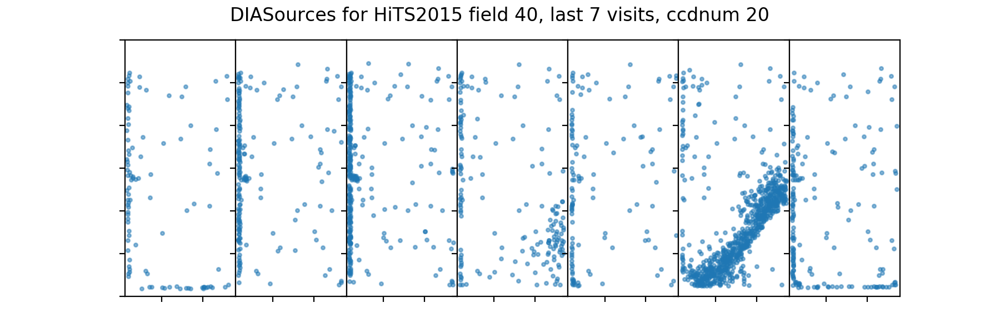

In [36]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('DIASources for HiTS2015 field 40, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList40[-7::]):
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    diasrc = butler.get('deepDiff_diaSrc', dataId=dataId)
    ra = diasrc['coord_ra']
    dec = diasrc['coord_dec']
    ax = fig.add_subplot(1, 7, idx+1)
    plt.scatter(dec, ra, color='C0', alpha=0.5, s=5)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    plt.gca().set_xlim([-0.1081, -0.1108])
    plt.gca().set_ylim([2.702, 2.696])
    plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


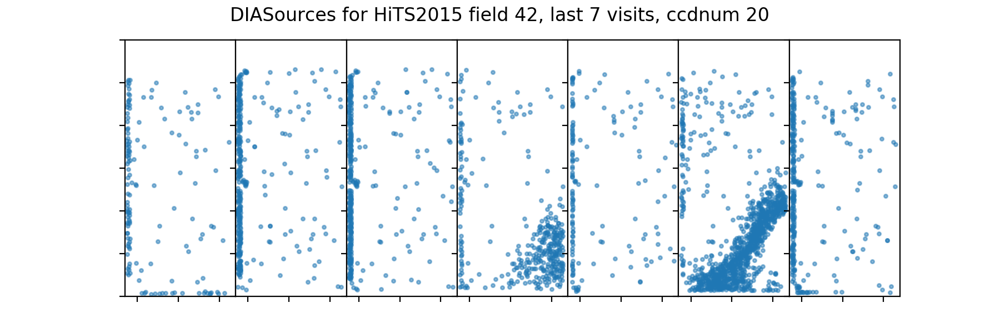

In [37]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('DIASources for HiTS2015 field 42, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList42[-7::]):
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    diasrc = butler.get('deepDiff_diaSrc', dataId=dataId)
    ra = diasrc['coord_ra']
    dec = diasrc['coord_dec']
    ax = fig.add_subplot(1, 7, idx+1)
    plt.scatter(dec, ra, color='C0', alpha=0.5, s=5)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    plt.gca().set_xlim([-0.0807, -0.0834])
    plt.gca().set_ylim([2.708, 2.702])
    plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


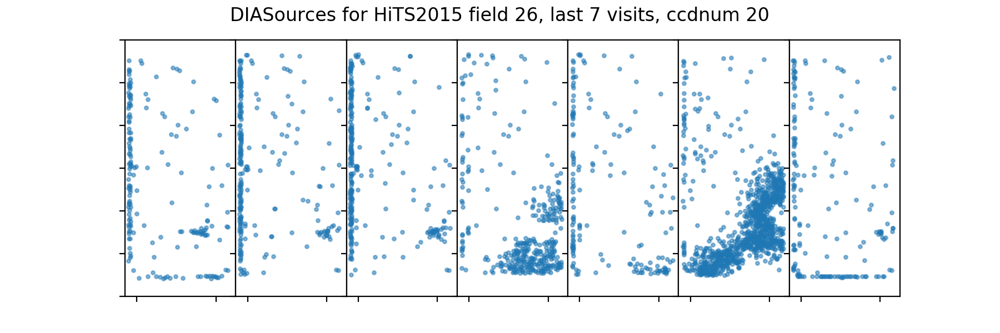

In [38]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('DIASources for HiTS2015 field 26, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList26[-7::]):
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    diasrc = butler.get('deepDiff_diaSrc', dataId=dataId)
    ra = diasrc['coord_ra']
    dec = diasrc['coord_dec']
    ax = fig.add_subplot(1, 7, idx+1)
    plt.scatter(dec, ra, color='C0', alpha=0.5, s=5)
    #ax.invert_xaxis()
    #ax.invert_yaxis()
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    #plt.gca().set_xlim([0.0415, 0.0386])
    #plt.gca().set_ylim([2.612, 2.6065])
    plt.gca().set_xlim([0.0443, 0.0415])
    plt.gca().set_ylim([2.615, 2.609])
    plt.subplots_adjust(wspace=0, hspace=0)

### So, something about a bad seeing night causes certain CCDs to have bad background subtraction in the same places each time

Is this a failure of illumination correction? (Are we even doing illumination correction? Pretty sure we aren't...)

One of the last steps in the DECam **community pipeline** (CP) is sky pattern removal (I think this is essentially the same as background or sky subtraction) and then illumination correction. One way to troubleshoot this is to try running ap_pipe on instcals (CP processed images) and see if this particular issue goes away.

I used ds9 to inspect three illumcors included with the ap_verify_hits2015 dataset:

```
(1) calib/c4d_150217_003458_ici_g_v1.fits.fz[S9] 
(2) calib/c4d_150309_045926_ici_g_v1.fits.fz[S9] 
(3) calib/c4d_150314_033132_ici_g_v1.fits.fz[S9]
```
(note that the S9 extension is equivalent to ccdnum 20)

It does appear that illumcor (1), which has a timestamp corresponding to MJD 57070 (2015-02-17), would apply to the majority of the visits up until MJD 57090 (2015-03-09), when illumcor (2) takes over. Finally, illumcor (3) would correspond to the final visits on MJD 57090 (2015-03-14).

The last two visits in each field were taken on 2015-03-09 and 2015-03-14, which suggests illumcors (2) and (3) would be used for these visits only. Ths visits on 2015-03-09 appear to have poorer seeing and are the origin of the majority of false DIASources plotted above.

The values in illumcor (1) are all very close to 0.8 across the chip. The values in illumcors (2) and (3) have more of a structure/pattern to them, with values in the 0.99 to 1.01 range.

## Let's make a new ap_pipe rerun with a constant background subtraction and see if the problem goes away

In [39]:
repo_flatbackground = '/project/mrawls/hits2015/rerun/cw_background1'
butler_flatbackground = dafPersist.Butler(repo_flatbackground)
dbPath_flatbackground = os.path.join(repo_flatbackground, 'association.db')

<IPython.core.display.Javascript object>


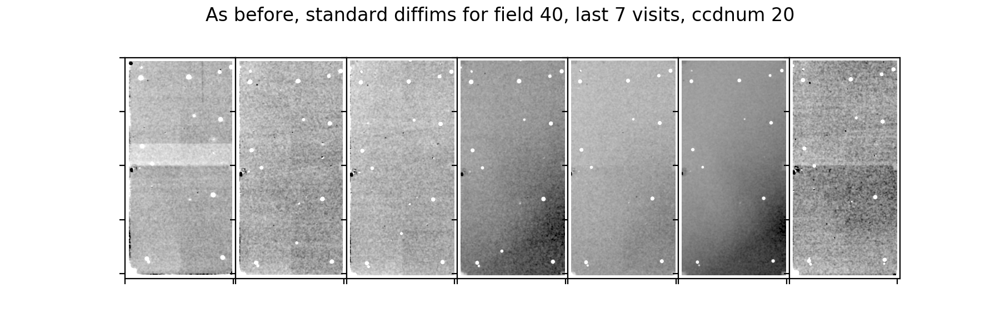

In [40]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('As before, standard diffims for field 40, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList40[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        diffim = butler.get('deepDiff_differenceExp', dataId=dataId)
    except:
        continue
    else:
        diffimArray = diffim.maskedImage.image.getArray()
        filtered = gaussian_filter(diffimArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


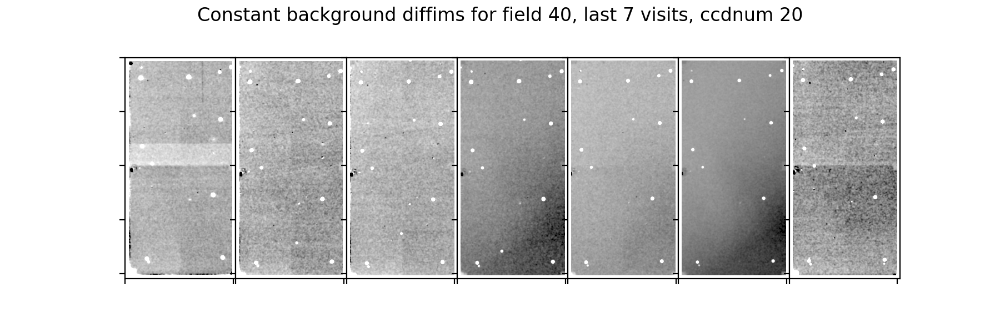

In [41]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('Constant background diffims for field 40, last 7 visits, ccdnum 20')
ccd = 20
for idx, visit in enumerate(visitList40[-7::]):
    fig.add_subplot(1, 7, idx+1)
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    try:
        diffim = butler_flatbackground.get('deepDiff_differenceExp', dataId=dataId)
    except:
        continue
    else:
        diffimArray = diffim.maskedImage.image.getArray()
        filtered = gaussian_filter(diffimArray, sigma=10)
        normFiltered = ImageNormalize(filtered, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(filtered, cmap='gray', norm=normFiltered)
        plt.gca().xaxis.set_ticklabels([])
        plt.gca().yaxis.set_ticklabels([])
        plt.subplots_adjust(wspace=0, hspace=0)

### tl;dr the problem did not go away 😭

## After discussion with Eric M at the ap_pipe meeting, we concluded the problem is sky brightness, and the solution is probably adding illumination correction to ISR

After some super fun times and DM-19874 mostly happening, I have a new ap_pipe run that has something close to illumination correction applied! Let's load it up!!

In [42]:
repo2 = '/project/mrawls/illumcor_party/rerun/cw_illumcor3'
butler2 = dafPersist.Butler(repo2)
dbPath2 = os.path.join(repo2, 'association.db')

In [43]:
objTable2 = loadAllPpdbObjects(repo2)

In [44]:
miniFilter2 = (objTable2['nDiaSources'] < 5)
oneField2 = (objTable2['ra'] < 153) & (objTable2['nDiaSources'] < 10)
otherFields2 = (objTable2['ra'] > 153) & (objTable2['nDiaSources'] < 10)

<IPython.core.display.Javascript object>


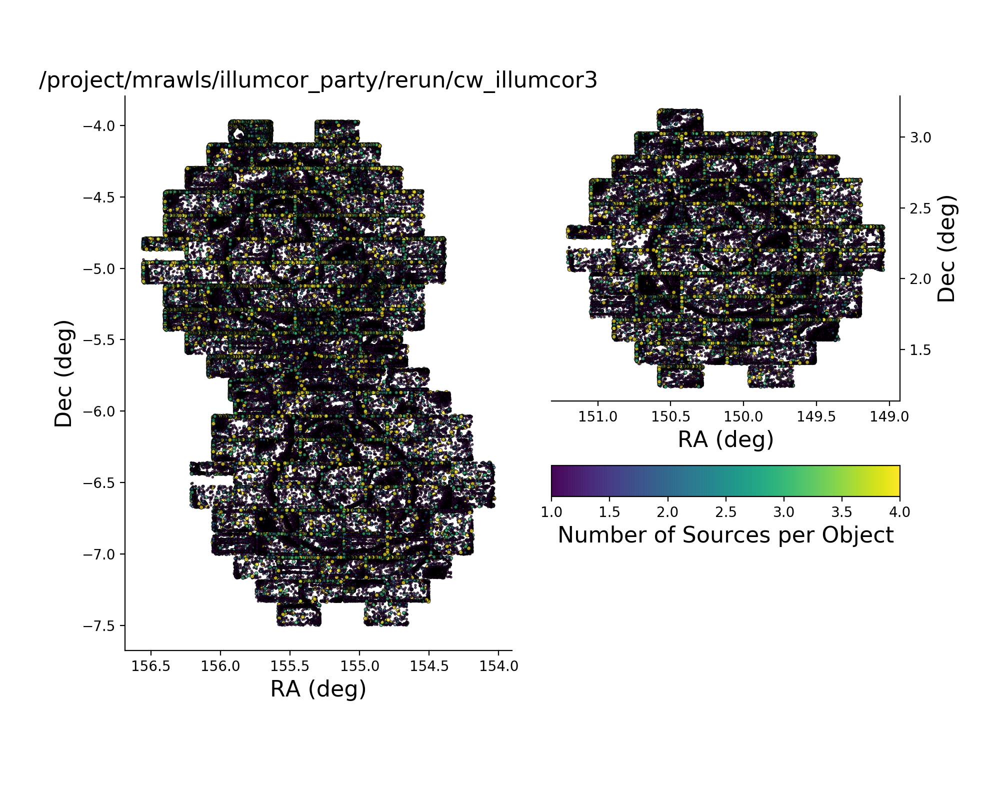

In [45]:
fig = plotDiaObjectsOnSky(repo2, objTable2, miniFilter2, hits=True)

In [46]:
oneCcd2 = ((objTable2['ra'] > 149.5) & (objTable2['ra'] < 149.8) &
           (objTable2['decl'] > 2.38) & (objTable2['decl'] < 2.54)) # ccdnum 20

<IPython.core.display.Javascript object>


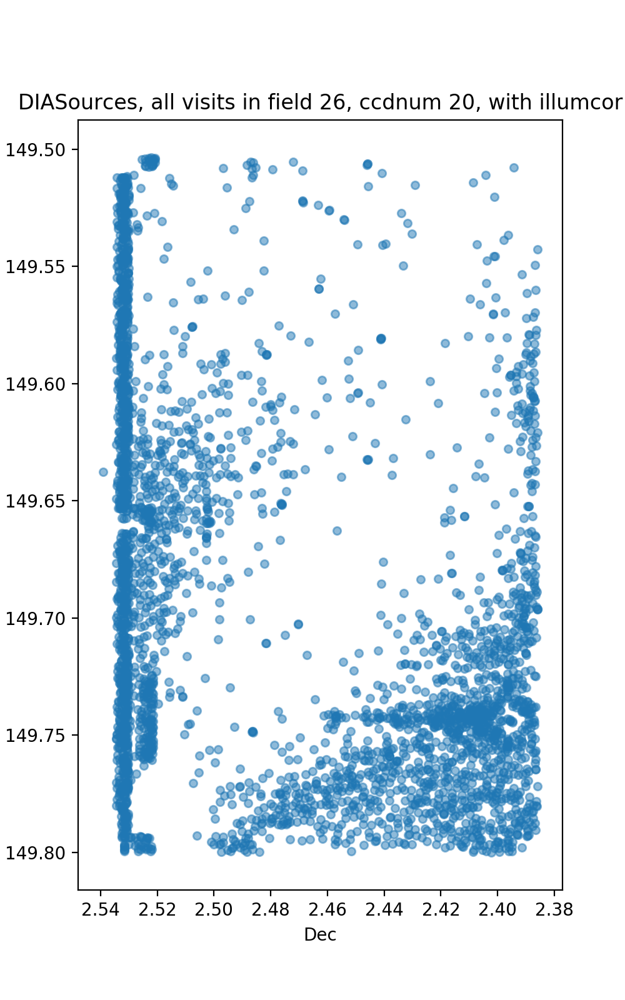

In [47]:
plt.figure(figsize=(5,8))
plt.title('DIASources, all visits in field 26, ccdnum 20, with illumcor')
plt.xlabel('Dec')
plt.ylabel('RA')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
for obj in objTable2.loc[oneCcd2, 'diaObjectId']:
    sources = plc.loadPpdbSources(dbPath2, obj)
    ra = objTable2.loc[objTable2['diaObjectId'] == obj, 'ra']
    dec = objTable2.loc[objTable2['diaObjectId'] == obj, 'decl']
    plt.scatter(dec, ra, color='C0', s=20, alpha=0.5)

<IPython.core.display.Javascript object>


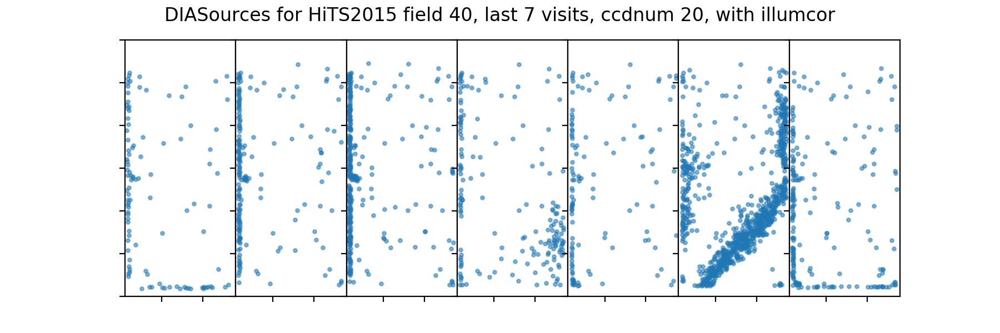

In [52]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('DIASources for HiTS2015 field 40, last 7 visits, ccdnum 20, with illumcor')
ccd = 20
for idx, visit in enumerate(visitList40[-7::]):
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    diasrc = butler2.get('deepDiff_diaSrc', dataId=dataId)
    ra = diasrc['coord_ra']
    dec = diasrc['coord_dec']
    ax = fig.add_subplot(1, 7, idx+1)
    plt.scatter(dec, ra, color='C0', alpha=0.5, s=5)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    plt.gca().set_xlim([-0.1081, -0.1108])
    plt.gca().set_ylim([2.702, 2.696])
    plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


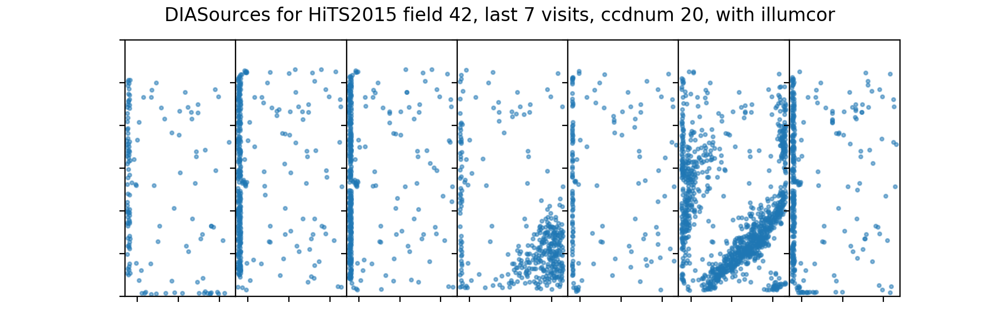

In [53]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('DIASources for HiTS2015 field 42, last 7 visits, ccdnum 20, with illumcor')
ccd = 20
for idx, visit in enumerate(visitList42[-7::]):
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    diasrc = butler2.get('deepDiff_diaSrc', dataId=dataId)
    ra = diasrc['coord_ra']
    dec = diasrc['coord_dec']
    ax = fig.add_subplot(1, 7, idx+1)
    plt.scatter(dec, ra, color='C0', alpha=0.5, s=5)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    plt.gca().set_xlim([-0.0807, -0.0834])
    plt.gca().set_ylim([2.708, 2.702])
    plt.subplots_adjust(wspace=0, hspace=0)

<IPython.core.display.Javascript object>


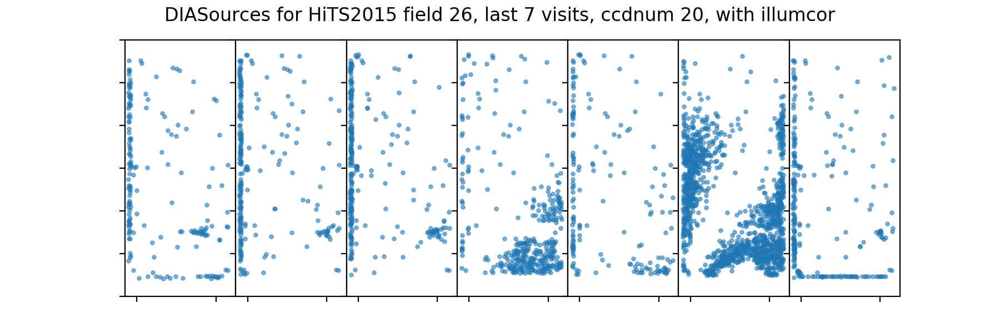

In [54]:
fig = plt.figure(figsize=(9, 3))
fig.suptitle('DIASources for HiTS2015 field 26, last 7 visits, ccdnum 20, with illumcor')
ccd = 20
for idx, visit in enumerate(visitList26[-7::]):
    dataId = {'filter': 'g', 'visit': visit, 'ccdnum': ccd}
    diasrc = butler2.get('deepDiff_diaSrc', dataId=dataId)
    ra = diasrc['coord_ra']
    dec = diasrc['coord_dec']
    ax = fig.add_subplot(1, 7, idx+1)
    plt.scatter(dec, ra, color='C0', alpha=0.5, s=5)
    #ax.invert_xaxis()
    #ax.invert_yaxis()
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    #plt.gca().set_xlim([0.0415, 0.0386])
    #plt.gca().set_ylim([2.612, 2.6065])
    plt.gca().set_xlim([0.0443, 0.0415])
    plt.gca().set_ylim([2.615, 2.609])
    plt.subplots_adjust(wspace=0, hspace=0)

## The morphology of the bad sources has subtly changed, but the problem persists